# <center>Analisando dados BIDMC PPG - Respiração</center>

Os dados originais (https://physionet.org/content/bidmc/1.0.0/) foram adquiridos de pacientes criticamente enfermos durante atendimento hospitalar no Beth Israel Deaconess Medical Center (Boston, MA, EUA). Dois anotadores anotaram manualmente respirações individuais em cada registro usando o sinal respiratório de impedância. As 53 gravações dentro do conjunto de dados, cada uma com 8 minutos de duração, cada uma contém:
<ul>
<li> Sinais fisiológicos, como PPG, sinal respiratório de impedância e eletrocardiograma (ECG). Eles são amostrados em 125 Hz; </li>
<li> Parâmetros fisiológicos, como frequência cardíaca (FC), frequência respiratória (FR) e nível de saturação de oxigênio no sangue (SpO2). Eles são amostrados em 1 Hz; </li>
<li> Parâmetros fixos, como idade e sexo; </li>
<li> Anotações manuais de respirações.</li>
</ul>

## Dados Formato CSV

Arquivos CSV separados são fornecidos para cada gravação (onde ## é o número do paciente), contendo:
<ul>
<li> bidmc _ ## _ Breaths.csv: anotações de respiração manual; </li>
<li> bidmc _ ## _ Signals.csv: sinais fisiológicos; </li>
<li> bidmc _ ## _ Numerics.csv: Parâmetros fisiológicos; </li>
<li> bidmc _ ## _ Fix.txt: variáveis fixas.</li>
</ul>

Artigos de referencia - (https://ieeexplore.ieee.org/document/6713498) - (https://ieeexplore.ieee.org/document/8648205) - https://ieeexplore.ieee.org/abstract/document/8410910

In [2]:
%%time
import pandas as pd
import os

Wall time: 1.89 s


In [2]:
os.chdir("C:\\Users\\ayalo\\PPG\\BIDMC-dadosOriginais" )
caminho3 = 'bidmc_csv/bidmc_02_Numerics.csv'
caminho4 = 'bidmc_csv/bidmc_01_Fix.txt'
caminho5 = 'bidmc_csv/bidmc_01_Signals.csv'
pd.set_option("display.max_rows", None)

In [3]:
import plotly
import plotly.offline as py
import plotly.graph_objs as go


# Inicializa o modo Plotly Notebook 
py.init_notebook_mode(connected=False)

# Função de Setup: devido ao Plotly estar sendo utilizado no Google Colab, 
# é preciso definir a função abaixo e chamá-la sempre que for exibir um gráfico
def configure_plotly_browser_state():
  import IPython
  from plotly.offline import init_notebook_mode 
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))
  init_notebook_mode(connected=False)

In [4]:
import numpy  as np
import pandas as pd
from PyEMD import EMD
from scipy.fft import fft, fftfreq

#from numpy import empty
PadraoOuro = np.empty((54, 481))
ValorOuro = np.empty((54,1))
Sinal_Original = np.empty((54, 60001))
IMF1 = np.empty((54, 60001))
IMF2 = np.empty((54, 60001))
IMF3 = np.empty((54, 60001))
IMF4 = np.empty((54, 60001))
IMF5 = np.empty((54, 60001))
IMF6 = np.empty((54, 60001))
IMF7 = np.empty((54, 60001))
IMF8 = np.empty((54, 60001))
IMF9 = np.empty((54, 60001))
IMF10 = np.empty((54, 60001))
IMF11 = np.empty((54, 60001))

# Number of sample points
N = 60001
# sample spacing
T = 1.0 / 125
XfftIMF5 = np.empty((54, 550))
YfftIMF5 = np.empty((54, 550))

for i in range(54):
    
    if i == 0:
        print("/content/drive/MyDrive/Colab Notebooks/bidmc_csv/bidmc_00")
    
    if i > 0 and i < 10:
        caminho3 = "bidmc_csv/bidmc_0"+str(i)+"_Numerics.csv"
        caminho5 = "bidmc_csv/bidmc_0"+str(i)+"_Signals.csv"
        
        #Dados padrao outro respiração
        numerics = pd.read_csv(caminho3)
        respiracao_signal = numerics[' RESP']
        sinal_convertido = respiracao_signal.to_numpy()
        media = sinal_convertido.mean()
        PadraoOuro[i] = sinal_convertido
        ValorOuro[i] = media

        ####################################################
        # EMD
        # Define signal
        signals = pd.read_csv(caminho5)
        s = signals[[' PLETH']]
        s = s.to_numpy()
        s_trans = s.transpose()
        Signal_PPG = s_trans[0]
        time = np.linspace(0, 1, 60001)

        # Assign max IMF on signal
        emd1 = EMD()
        #emd1 = EMD(MAX_ITERATION = 10)

        # Execute EMD on signal
        #IMF = emd1.emd(Signal_PPG,time, max_imf = 3)
        IMF = emd1.emd(Signal_PPG,time)

        Sinal_Original[i] = Signal_PPG
        IMF1[i] = IMF[0]
        IMF2[i] = IMF[1]
        IMF3[i] = IMF[2]
        IMF4[i] = IMF[3]
        IMF5[i] = IMF[4]
        IMF6[i] = IMF[5]
        IMF7[i] = IMF[6]
        IMF8[i] = IMF[7]
        IMF9[i] = IMF[8]
        IMF10[i] = IMF[9]
        IMF11[i] = IMF[10]

        ####################################################
        # FFT

        y = IMF6[i]
        yf = fft(y)
        x = fftfreq(N, T)[:N//2]
        y = 2.0/N * np.abs(yf[0:N//2])
        XfftIMF5[i] = x[0:550]
        YfftIMF5[i] = y[0:550]
        ####################################################
   
    if i >= 10 and i<54:
        caminho3 = "bidmc_csv/bidmc_"+str(i)+"_Numerics.csv"
        caminho5 = "bidmc_csv/bidmc_"+str(i)+"_Signals.csv"
        
        numerics = pd.read_csv(caminho3)
        respiracao_signal = numerics[' RESP']
        sinal_convertido = respiracao_signal.to_numpy()
        media = sinal_convertido.mean()
        PadraoOuro[i] = sinal_convertido
        ValorOuro[i] = media

         ####################################################
        # EMD
        # Define signal
        signals = pd.read_csv(caminho5)
        s = signals[[' PLETH']]
        s = s.to_numpy()
        s_trans = s.transpose()
        Signal_PPG = s_trans[0]
        time = np.linspace(0, 1, 60001)     

        # Assign max IMF on signal
        emd1 = EMD()
        #emd1 = EMD(MAX_ITERATION = 10)

        # Execute EMD on signal
        #IMF = emd1.emd(Signal_PPG,time, max_imf = 3)
        IMF = emd1.emd(Signal_PPG,time)

        Sinal_Original[i] = Signal_PPG
        IMF1[i] = IMF[0]
        IMF2[i] = IMF[1]
        IMF3[i] = IMF[2]
        IMF4[i] = IMF[3]
        IMF5[i] = IMF[4]
        IMF6[i] = IMF[5]
        IMF7[i] = IMF[6]
        IMF8[i] = IMF[7]
        IMF9[i] = IMF[8]
        IMF10[i] = IMF[9]
        IMF11[i] = IMF[10]

        ####################################################
        # FFT

        y = IMF6[i]
        yf = fft(y)
        x = fftfreq(N, T)[:N//2]
        y = 2.0/N * np.abs(yf[0:N//2])
        XfftIMF5[i] = x[0:550]
        YfftIMF5[i] = y[0:550]
        ####################################################

/content/drive/MyDrive/Colab Notebooks/bidmc_csv/bidmc_00


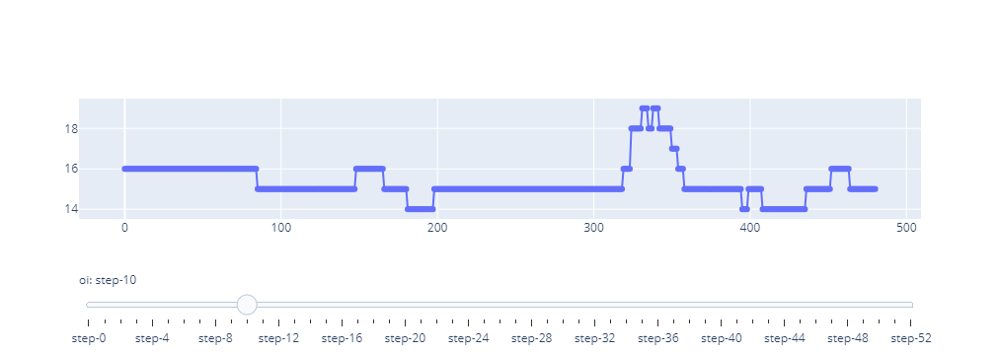

In [5]:
## PADRAO OURO
# Código necessário para executar o Plotly em uma "code cell"
configure_plotly_browser_state()

# Create figure
fig = go.Figure()
# Add all traces of pacient
for step in range(1,54):
  fig.add_trace(
      go.Scatter(
          visible=False,
          x=numerics['Time [s]'],
          y=PadraoOuro[step],
          name="Paciente"+str(1),
          line_shape='linear'))

# Make 10th trace visible
fig.data[1].visible = True


# Create and add slider
steps = []
for i in range(len(fig.data)):
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig.data)},
              {"title": "Padrão ouro dos pacientes: " + str(i+1)}],  # layout attribute
    )
    step["args"][0]["visible"][i] = True  # Toggle i'th trace to "visible"
    steps.append(step)

sliders = [dict(
    active=10,
    currentvalue={"prefix": "oi: "},
    pad={"t": 50},
    steps=steps
)]

fig.update_layout(
    sliders=sliders
)

# Edit slider labels
fig['layout']['sliders'][0]['currentvalue']['prefix']='Paciente: '
for i in range(0,53):
    fig['layout']['sliders'][0]['steps'][i]['label']=i+1


fig.show()

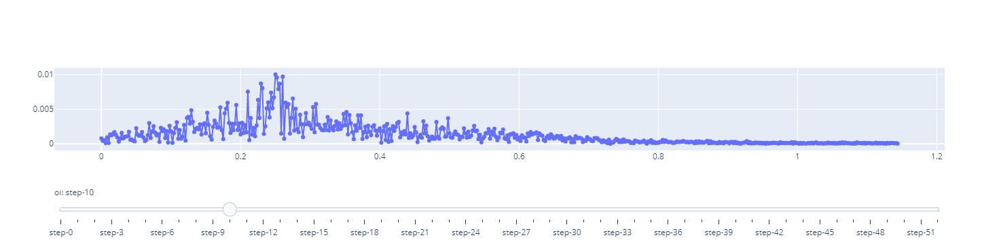

In [6]:
## FFT PLOT
# Código necessário para executar o Plotly em uma "code cell"
configure_plotly_browser_state()

# Create figure
fig = go.Figure()
# Add all traces of pacient
for step in range(1,54):
  fig.add_trace(
      go.Scatter(
          visible=False,
          x=XfftIMF5[step],
          y=YfftIMF5[step],
          name="Paciente"+str(1),
          line_shape='linear'))

# Make 10th trace visible
fig.data[1].visible = True


# Create and add slider
steps = []
for i in range(len(fig.data)):
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig.data)},
              {"title": "Padrão ouro dos pacientes: " + str(i+1)}],  # layout attribute
    )
    step["args"][0]["visible"][i] = True  # Toggle i'th trace to "visible"
    steps.append(step)

sliders = [dict(
    active=10,
    currentvalue={"prefix": "oi: "},
    pad={"t": 50},
    steps=steps
)]

fig.update_layout(
    sliders=sliders
)

# Edit slider labels
fig['layout']['sliders'][0]['currentvalue']['prefix']='Paciente: '
for i in range(0,53):
    fig['layout']['sliders'][0]['steps'][i]['label']=i+1


fig.show()

In [1]:
%%time
# Código necessário para executar o Plotly em uma "code cell"
configure_plotly_browser_state()

X = np.linspace(0, 1, 60001)

# Create figure
fig = go.Figure()
# Add all traces of pacient
for step in range(1,54):
  Y = IMF6[step]
  fig.add_trace(
      go.Scatter(
          visible=False,
          x=X,
          y=Y[0:60000],
          name="Paciente"+str(1),
          line_shape='linear'))

# Make 10th trace visible
fig.data[1].visible = True


# Create and add slider
steps = []
for i in range(len(fig.data)):
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig.data)},
              {"title": "Padrão ouro dos pacientes: " + str(i+1)}],  # layout attribute
    )
    step["args"][0]["visible"][i] = True  # Toggle i'th trace to "visible"
    steps.append(step)

sliders = [dict(
    active=10,
    currentvalue={"prefix": "oi: "},
    pad={"t": 50},
    steps=steps
)]

fig.update_layout(
    sliders=sliders
)

# Edit slider labels
fig['layout']['sliders'][0]['currentvalue']['prefix']='Paciente: '
for i in range(0,53):
    fig['layout']['sliders'][0]['steps'][i]['label']=i+1


fig.show()

NameError: name 'configure_plotly_browser_state' is not defined

In [18]:
Y0 = Sinal_Original[1]
Y0.shape

(60001,)

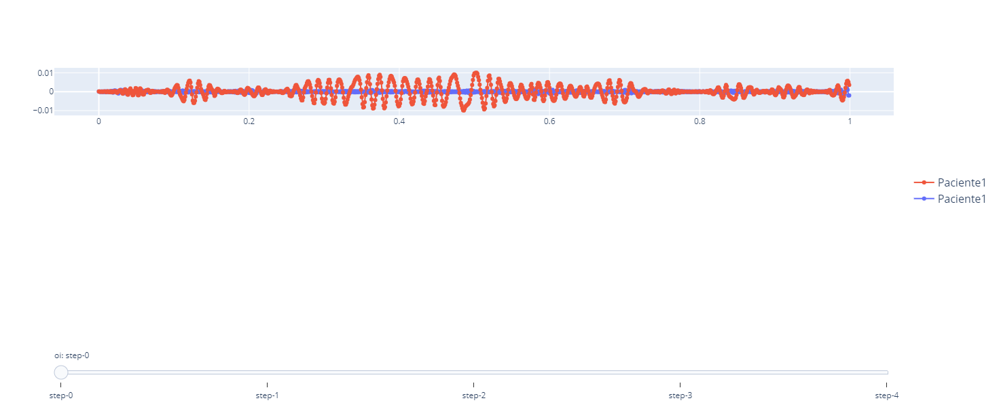

In [27]:
# Código necessário para executar o Plotly em uma "code cell"
configure_plotly_browser_state()

X = np.linspace(0, 1, 1001)

# Create figure
from plotly.subplots import make_subplots
fig = make_subplots(rows=4, cols=1)
# Add all traces of pacient
#for step in range(1,3):
Y0 = Sinal_Original[1]
Y1 = IMF1[1]
Y2 = IMF2[1]
Y3 = IMF3[1]
Y4 = IMF4[1]
Y5 = IMF5[1]
Y6 = IMF6[1]
Y7 = IMF7[1]
Y8 = IMF8[1]
Y9 = IMF9[1]
Y10 = IMF10[1]
Y11 = IMF11[1]
fig.add_trace(
    go.Scatter(
        visible=False,
        x=X,
        y=Y0[0:1000],
        name="Paciente"+str(1),
        line_shape='linear'))
fig.add_trace(
    go.Scatter(
        visible=False,
        x=X,
        y=Y1[0:1000],
        name="Paciente"+str(1),
        line_shape='linear'))
fig.add_trace(
    go.Scatter(
        visible=False,
        x=X,
        y=Y2[0:1000],
        name="Paciente"+str(1),
        line_shape='linear'))
fig.add_trace(
    go.Scatter(
        visible=False,
        x=X,
        y=Y3[0:1000],
        name="Paciente"+str(1),
        line_shape='linear'))
fig.add_trace(
    go.Scatter(
        visible=False,
        x=X,
        y=Y4[0:1000],
        name="Paciente"+str(1),
        line_shape='linear'))

    

# Make 10th trace visible
fig.data[1].visible = True
fig.data[2].visible = True

# Create and add slider
steps = []
for i in range(len(fig.data)):
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig.data)},
              {"title": "Padrão ouro dos pacientes: " + str(i+1)}],  # layout attribute
    )
    step["args"][0]["visible"][i] = True  # Toggle i'th trace to "visible"
    steps.append(step)

sliders = [dict(
    active=10,
    currentvalue={"prefix": "oi: "},
    pad={"t": 50},
    steps=steps
)]

fig.update_layout(
    sliders=sliders
)


fig.update_traces(hoverinfo='text+name', mode='lines+markers')
fig.update_layout(height=600, width=600,legend=dict(y=0.5, traceorder='reversed', font_size=16))

fig.show()

In [26]:
%matplotlib widget

from PyEMD import EMD
from numpy import genfromtxt
import numpy  as np
import matplotlib.pyplot as plt
import pandas as pd

# Define signal
##Signal_PPG = genfromtxt(caminho2, delimiter=',')
signals = pd.read_csv(caminho5)
s = signals[[' PLETH']]
s = s.to_numpy();
s_trans = s.transpose()
Signal_PPG = s_trans[0]
time = np.linspace(0, 1, 60001)

# Assign max IMF on signal
emd1 = EMD()
#emd1 = EMD(MAX_ITERATION = 10)


# Execute EMD on signal
#IMF = emd1.emd(Signal_PPG,time, max_imf = 3)
IMF = emd1.emd(Signal_PPG,time)
N = IMF.shape[0]+1

x = emd1.get_imfs_and_residue( )

# Plot results
plt.figure(figsize=(14, 16))

plt.subplot(N,1,1)
plt.plot(time, Signal_PPG, 'r')
plt.title("Input signal: PPG")
plt.xlabel("Time [s]")

#plt.subplot(2,1,2)
#plt.plot(time, imf)

for n, imf in enumerate(IMF):
    plt.subplot(N,1,n+2)
    plt.plot(time, imf, 'g')
    plt.title("IMF "+str(n+1))
    plt.xlabel("Time [s]")

plt.show()

KeyboardInterrupt: 

In [ ]:
from scipy.fft import fft, fftfreq
# Number of sample points
N = 60001
# sample spacing
T = 1.0 / 125
x = np.linspace(0.0, N*T, N, endpoint=False)
##Respiração
y = IMF[6]
##BatimentoCardiaco
#y = IMF[4]
yf = fft(y)
xf = fftfreq(N, T)[:N//2]
import matplotlib.pyplot as plt
plt.figure(figsize=(14, 4))
plt.plot(xf, 2.0/N * np.abs(yf[0:N//2]))
plt.grid()
plt.show()

In [ ]:
from PyEMD import EEMD
import numpy as np
import pylab as plt

# Define signal
##Signal_PPG = genfromtxt(caminho2, delimiter=',')
s = signals[[' PLETH']]
s = s.to_numpy();
s_trans = s.transpose()
Signal_PPG = s_trans[0]
time = np.linspace(0, 1, 60001)

# Assign EEMD to `eemd` variable
eemd1 = EEMD()

# Say we want detect extrema using parabolic method
#emd = eemd.EMD
#emd.extrema_detection="parabol"

# Execute EEMD on S
eIMFs = eemd1.eemd(Signal_PPG,time)
nIMFs = eIMFs.shape[0]

# Plot results
plt.figure(figsize=(12,15))
plt.subplot(nIMFs+1, 1, 1)
plt.plot(time, Signal_PPG, 'r')

for n in range(nIMFs):
    plt.subplot(nIMFs+1, 1, n+2)
    plt.plot(time, eIMFs[n], 'g')
    plt.ylabel("eIMF %i" %(n+1))
    plt.locator_params(axis='y', nbins=5)

plt.xlabel("Time [s]")
plt.tight_layout()
plt.savefig('eemd_example', dpi=120)
plt.show()

In [ ]:
from scipy.fft import fft, fftfreq
# Number of sample points
N = 60001
# sample spacing
T = 1.0 / 125
x = np.linspace(0.0, N*T, N, endpoint=False)
##Respiração
y = eIMFs[8]
##BatimentoCardiaco
#y = eIMFs[4]
yf = fft(y)
xf = fftfreq(N, T)[:N//2]
import matplotlib.pyplot as plt
plt.figure(figsize=(14, 4))
plt.plot(xf, 2.0/N * np.abs(yf[0:N//2]))
plt.grid()
plt.show()

In [ ]:
from PyEMD import CEEMDAN
import numpy as np
import pylab as plt

# Define signal
##Signal_PPG = genfromtxt(caminho2, delimiter=',')
s = signals[[' PLETH']]
s = s.to_numpy();
s_trans = s.transpose()
Signal_PPG = s_trans[0]
time = np.linspace(0, 1, 60001)

# Assign EEMD to `eemd` variable
ceemdan1 = CEEMDAN()

# Execute EEMD on S
c_imfs = ceemdan1.ceemdan(Signal_PPG,time)
nIMFs = c_imfs.shape[0]

# Plot results
plt.figure(figsize=(12,15))
plt.subplot(nIMFs+1, 1, 1)
plt.plot(time, Signal_PPG, 'r')

for n in range(nIMFs):
    plt.subplot(nIMFs+1, 1, n+2)
    plt.plot(time, c_imfs[n], 'g')
    plt.ylabel("eIMF %i" %(n+1))
    plt.locator_params(axis='y', nbins=5)

plt.xlabel("Time [s]")
plt.tight_layout()
plt.savefig('ceemdan_example', dpi=120)
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import qgrid
import os

In [ ]:
os.chdir("C:\\Users\\ayalo\\PPG\\BIDMC-dadosOriginais" )
caminho2 = 'bidmc_csv/bidmc_02_Signals - Copia.csv'
caminho3 = 'bidmc_csv/bidmc_02_Numerics.csv'
caminho4 = 'bidmc_csv/bidmc_01_Fix.txt'
caminho5 = 'bidmc_csv/bidmc_01_Signals.csv'
pd.set_option("display.max_rows", None)

In [ ]:
import os

In [ ]:
signals = pd.read_csv(caminho5)
signals.columns

In [ ]:
numerics = pd.read_csv(caminho3)
numerics.columns

In [ ]:
%matplotlib widget
plt.figure(figsize=(14, 4))
X = numerics

plt.plot(X['Time [s]'],X[' RESP'], 'r')
plt.title('Anotador 2')
plt.xlabel('time (s)')
plt.ylabel('Frequencia Respiratoria')

plt.tight_layout()
plt.show()